In [1]:
# Importing all important libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
# Loading the dataset
df = pd.read_csv("survey.csv")
df

,Timestamp,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,...,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments
0,2014-08-27 11:29:31,37,Female,United States,IL,NaN,No,Yes,Often,6-25,...,Somewhat easy,No,No,Some of them,Yes,No,Maybe,Yes,No,NaN
1,2014-08-27 11:29:37,44,M,United States,IN,NaN,No,No,Rarely,More than 1000,...,Don't know,Maybe,No,No,No,No,No,Don't know,No,NaN
2,2014-08-27 11:29:44,32,Male,Canada,NaN,NaN,No,No,Rarely,6-25,...,Somewhat difficult,No,No,Yes,Yes,Yes,Yes,No,No,NaN
3,2014-08-27 11:29:46,31,Male,United Kingdom,NaN,NaN,Yes,Yes,Often,26-100,...,Somewhat difficult,Yes,Yes,Some of them,No,Maybe,Maybe,No,Yes,NaN
4,2014-08-27 11:30:22,31,Male,United States,TX,NaN,No,No,Never,100-500,...,Don't know,No,No,Some of them,Yes,Yes,Yes,Don't know,No,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2015-09-12 11:17:21,26,male,United Kingdom,NaN,No,No,Yes,NaN,26-100,...,Somewhat easy,No,No,Some of them,Some of them,No,No,Don't know,No,NaN
1255,2015-09-26 01:07:35,32,Male,United States,IL,No,Yes,Yes,Often,26-100,...,Somewhat difficult,No,No,Some of them,Yes,No,No,Yes,No,NaN
1256,2015-11-07 12:36:58,34,male,United States,CA,No,Yes,Yes,Sometimes,More than 1000,...,Somewhat difficult,Yes,Yes,No,No,No,No,No,No,NaN
1257,2015-11-30 21:25:06,46,f,United States,NC,No,No,No,NaN,100-500,...,Don't know,Yes,No,No,No,No,No,No,No,NaN


#### Lets know about our data

1. Nummber of rows and columns in data
2. All columns name
3. All features information like not null & dtypes
4. statistical aspect of dataframe

This step will give basic understanding of the dataset and the future analysis steps that how we should process with the analysis

In [4]:
print(f"This dataset has {df.shape[0]} rows and {df.shape[1]} columns \n")
print(f"The columns of the  dataset include \n {df.columns}\n")
print(f"The dataset info is \n {df.info()}\n")
print(f"The statistical aspect of dataset is \n {df.describe(include="all")}")

This dataset has 1259 rows and 27 columns 

The columns of the  dataset include 
 Index(['Timestamp', 'Age', 'Gender', 'Country', 'state', 'self_employed',
       'family_history', 'treatment', 'work_interfere', 'no_employees',
       'remote_work', 'tech_company', 'benefits', 'care_options',
       'wellness_program', 'seek_help', 'anonymity', 'leave',
       'mental_health_consequence', 'phys_health_consequence', 'coworkers',
       'supervisor', 'mental_health_interview', 'phys_health_interview',
       'mental_vs_physical', 'obs_consequence', 'comments'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Timestamp                  1259 non-null   object
 1   Age                        1259 non-null   int64 
 2   Gender                     1259 non-null   object
 3   Country                 

#### Insights
Age is the only numerical feature and rest all is of object type.

# Exploratory Data Analysis

#### **Step 1 : Check Missing Values**

In [8]:
# Creating a list of all null values features
feature_with_nan = [feature for feature in df if df[feature].isnull().sum()>0]

#Check how many missing values present
for feature in feature_with_nan:
    print(f"{feature} :-- {round(df[feature].isnull().mean()*100,2)}% missing values")

state :-- 40.91% missing values
self_employed :-- 1.43% missing values
work_interfere :-- 20.97% missing values
comments :-- 86.97% missing values


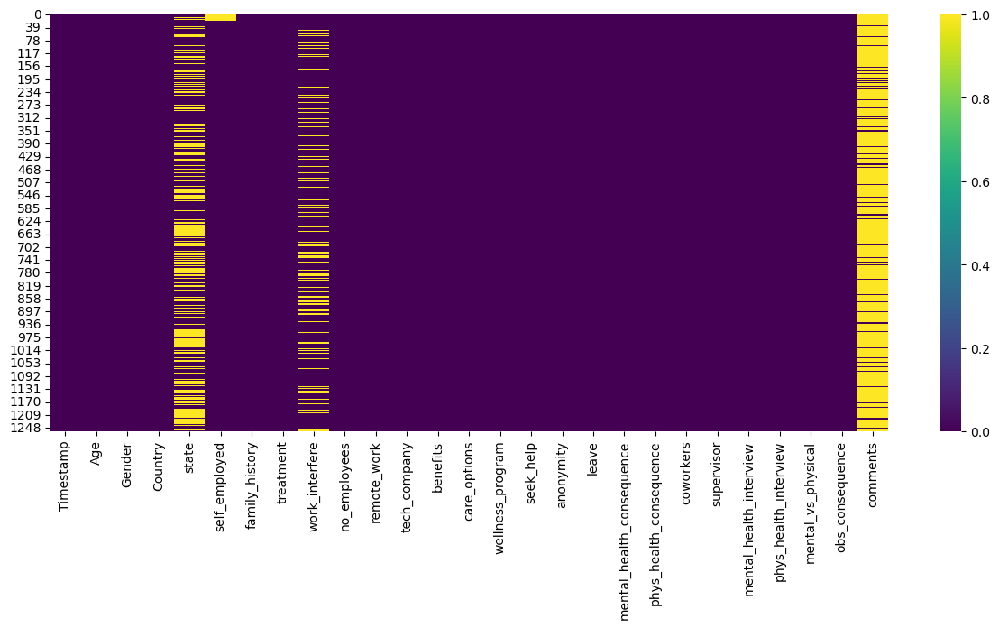

In [9]:
# Lets see it with heatmap
plt.figure(figsize=(15,6))
sns.heatmap(df.isnull(),cmap='viridis')
plt.show()

It clearly shows that **[state, comments, work_interfere]** have alot of missing values along with few in **self_employed**

Lets see their relationship with target variable

In [11]:
# lets make our target variable as 1 = yes and 0 = No

df['treatment'] = df['treatment'].apply(lambda x:1 if x=='Yes' else 0)
df['treatment'].unique()

array([1, 0], dtype=int64)

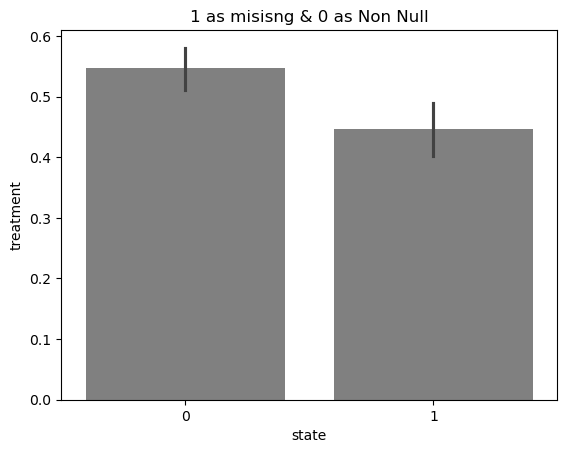

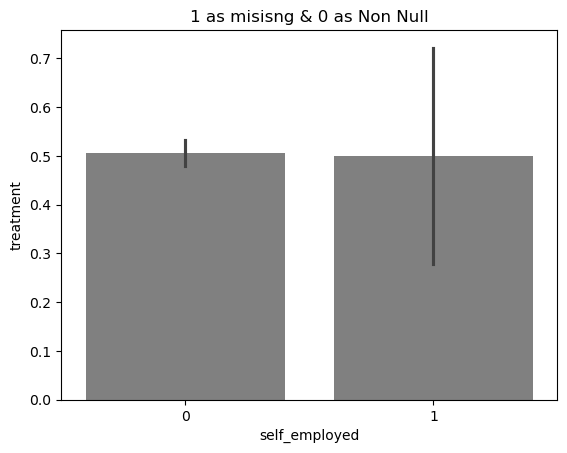

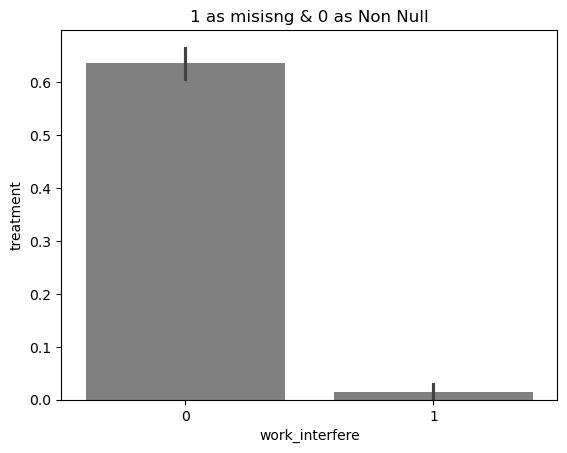

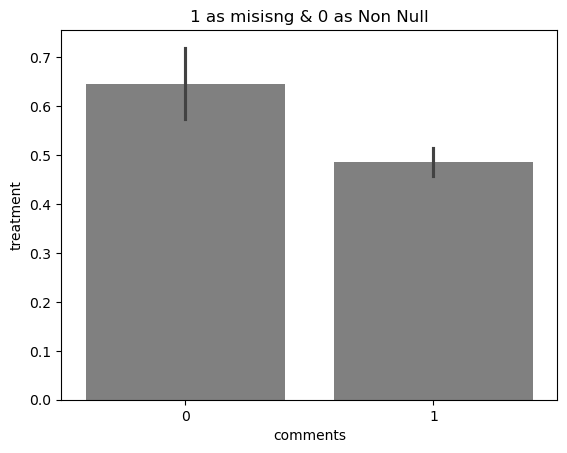

In [12]:
for feature in feature_with_nan:
    df_nan = df.copy()
    df_nan[feature] = np.where(df_nan[feature].isnull(),1,0)
    sns.barplot(data = df_nan,x= df_nan[feature],y='treatment',color='grey')
    plt.xlabel(feature)
    plt.ylabel('treatment')
    plt.title(f"1 as misisng & 0 as Non Null")
    plt.show()

From above we can clearly see that missing values are impacting in all features except self_employed feature

### Insights from step 1 : Missing values

- Comments has maximum missing values of 80%+ followed by State at 40%+.
- self_employed & work_interfere has 1.43% & 20.97% missing Values respectively
- All missing values are categorical feature(Nominal).

#### **Step 2: Check the feature dtype, name and values inside it of each feature. Highlight if we need to work anything in that**

In [15]:
for feature in df:
    print(f"Feature name:-- {feature} \nData Type:-- {df[feature].dtypes} \nAll Unique values:-- \n\n {df[feature].unique()}\n")

Feature name:-- Timestamp 
Data Type:-- object 
All Unique values:-- 

 ['2014-08-27 11:29:31' '2014-08-27 11:29:37' '2014-08-27 11:29:44' ...
 '2015-11-07 12:36:58' '2015-11-30 21:25:06' '2016-02-01 23:04:31']

Feature name:-- Age 
Data Type:-- int64 
All Unique values:-- 

 [         37          44          32          31          33          35
          39          42          23          29          36          27
          46          41          34          30          40          38
          50          24          18          28          26          22
          19          25          45          21         -29          43
          56          60          54         329          55 99999999999
          48          20          57          58          47          62
          51          65          49       -1726           5          53
          61           8          11          -1          72]

Feature name:-- Gender 
Data Type:-- object 
All Unique values:-- 

 ['Femal

### Insights from step 2 : Data Types and values

- Data Type wise all features are fine
- We need to work on Age(Outliers) and gender (many rare genders present in the column which we can mark as 'Other')
- Timestamp and comment columns are not required for our analysis so we can drop them.

#### **Step 3: Numerical and categorical feature categorization**
We have seen only one numerical feature above which is discrete and rest all is categorical feature.

Lets see the relation of age column with target variable. Also, Cardinality and relationship of each categorical feature

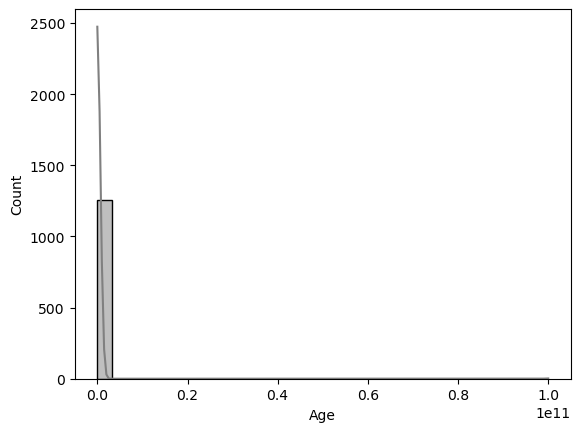

In [18]:
# Histplot for numerical feature: But age we should change into categorical(Ordinal) feature so we can use countplot also

sns.histplot(data=df,x='Age',bins=30,kde=True,color='grey')
plt.show()

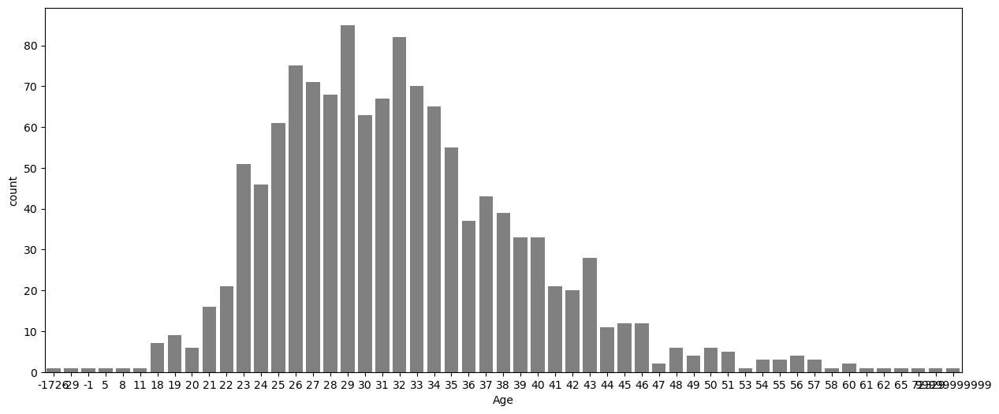

In [19]:
# Because of outliers histplot is not yeilding any information as such so lets see the count plot what we get

#since we know that we have only one numerical feature we can do like this
plt.figure(figsize=(15,6))
numerical_feature = ['Age']
sns.countplot(data = df, x= df['Age'],color='grey')
plt.show()

#### 👉 Very Clear guassian curve with outliers in it😂.

#### 👉 Most of the data lies in Age [25-35] age group.

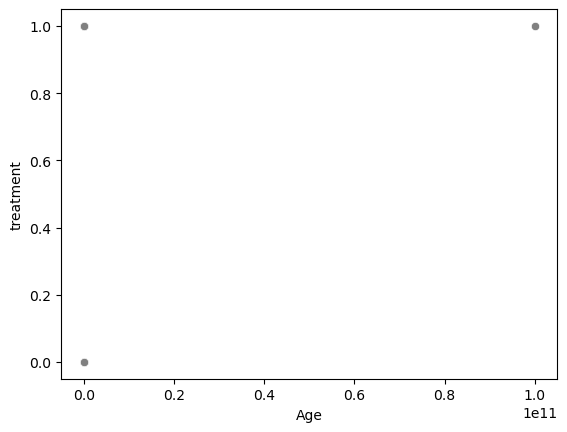

In [21]:
# Bivariate Analysis for numerical fetaure

sns.scatterplot(data=df,x=df['Age'],y='treatment',color='grey')
plt.show()

#### 👉 Beacuse of outlier it is giving such type of scatter plot. once we treat  outliers in feature we will again plot and see how  it is

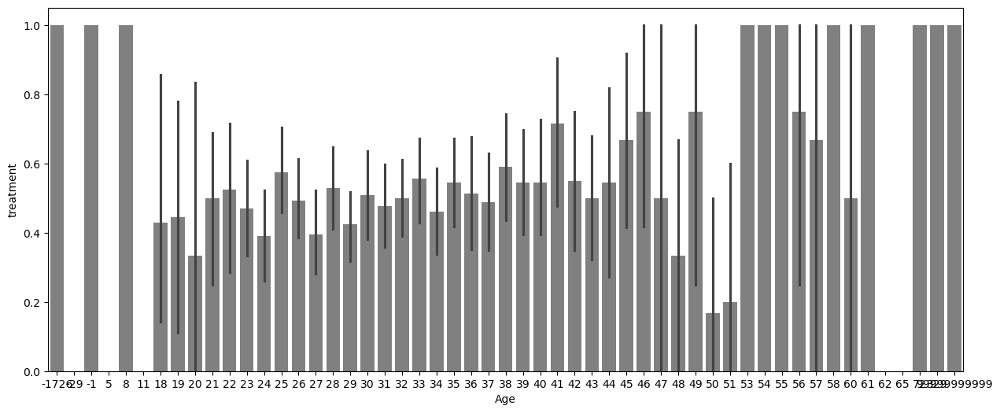

In [23]:
#Lets see bivariate analysis of above with bar graph
plt.figure(figsize=(15,6))
sns.barplot(data=df,x=df['Age'],y='treatment',color='grey')
plt.show()

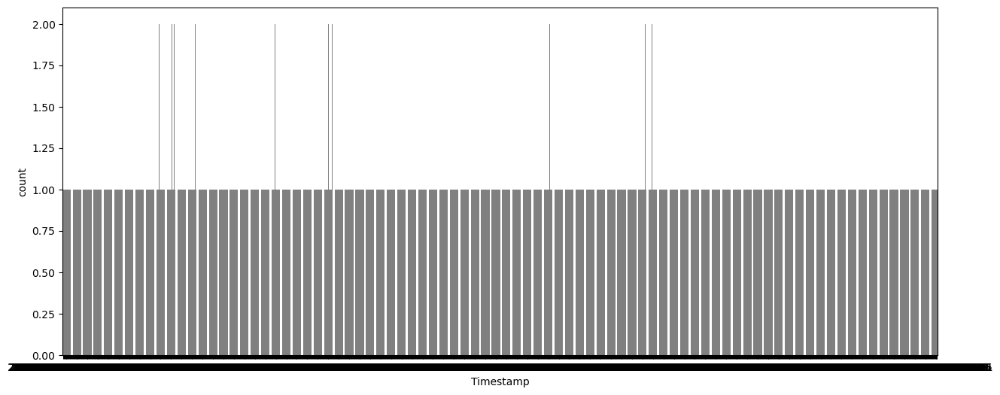

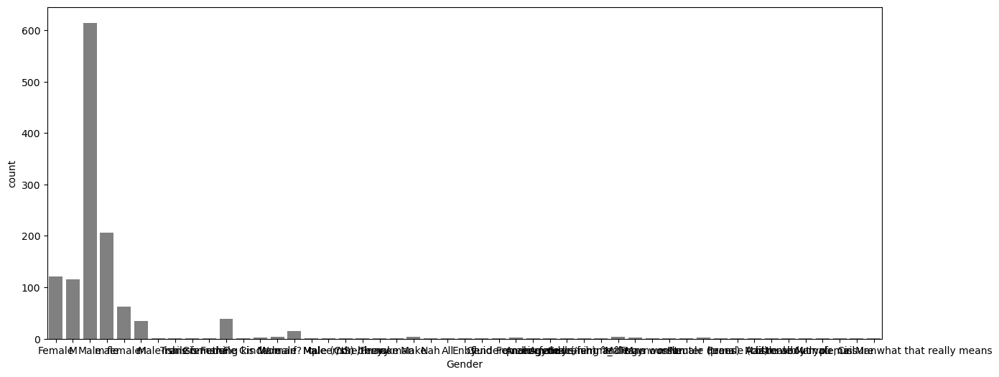

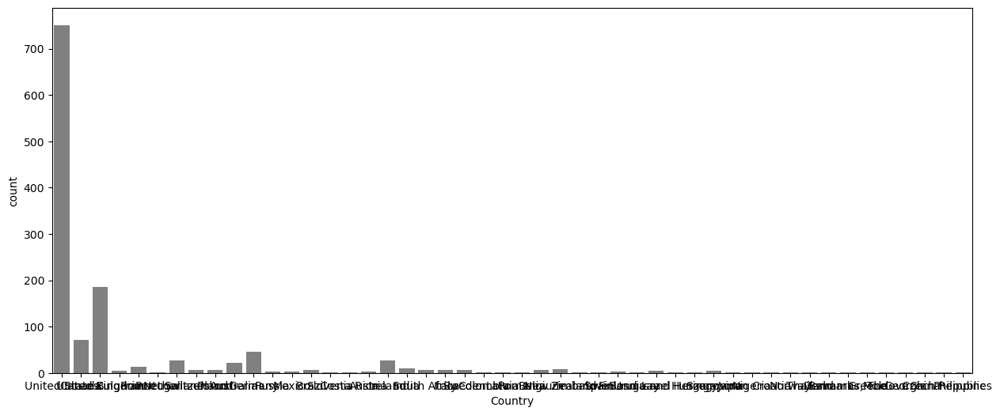

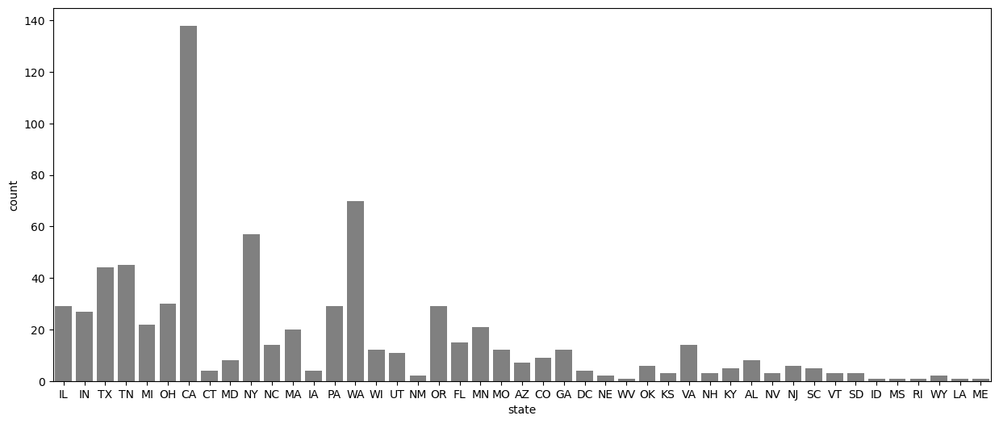

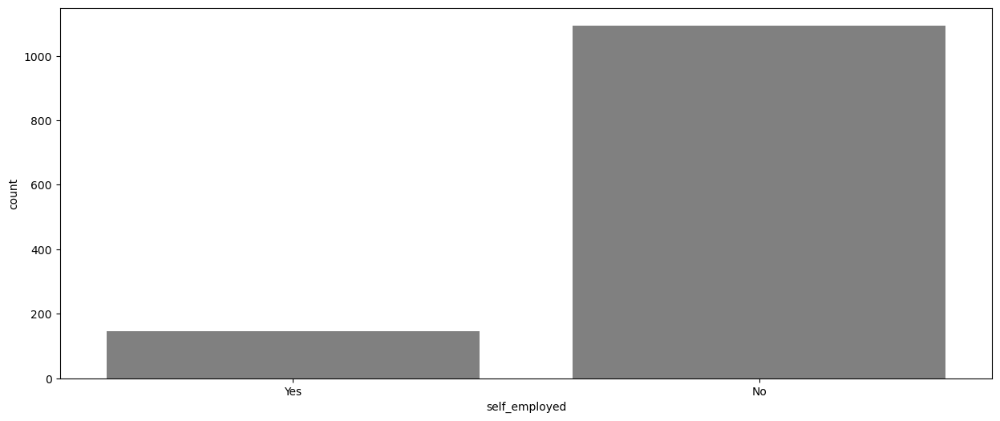

...

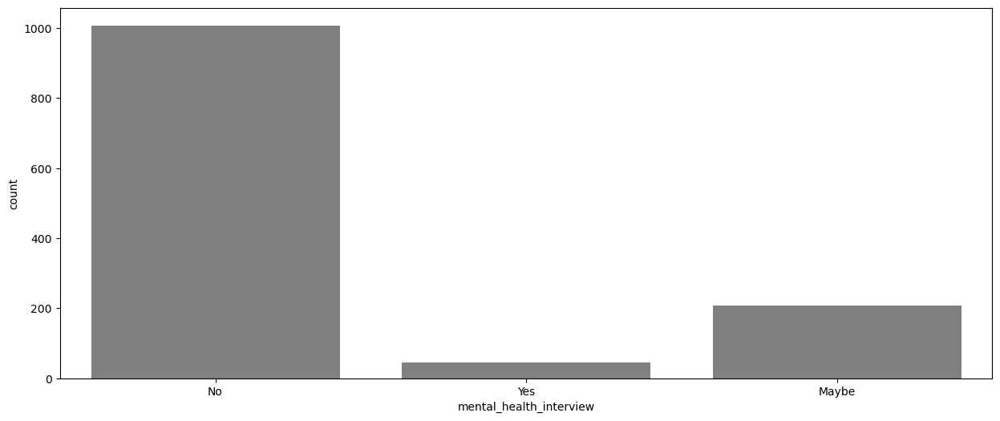

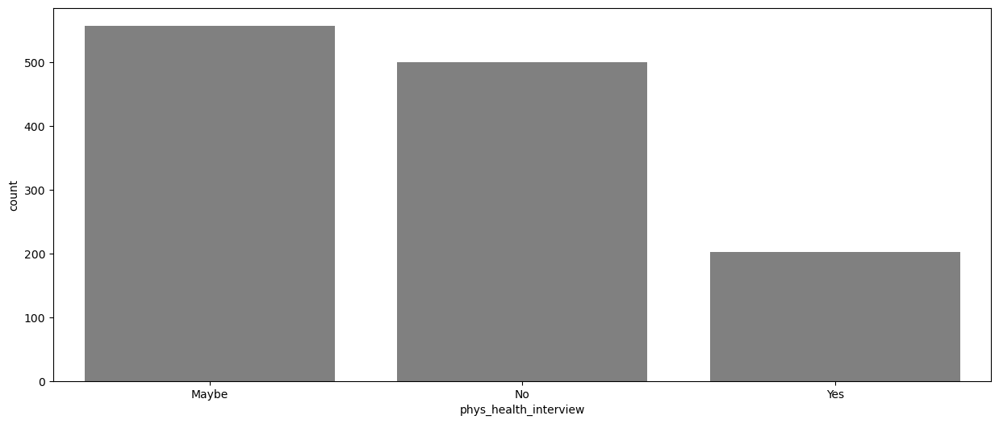

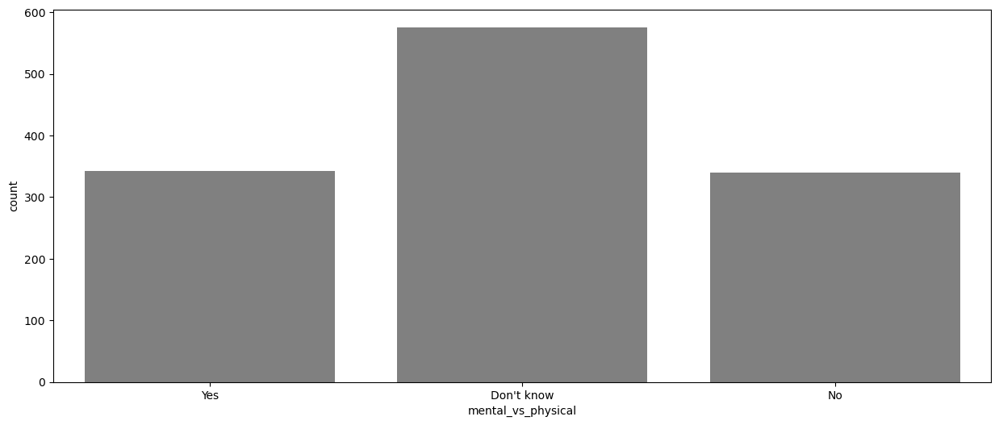

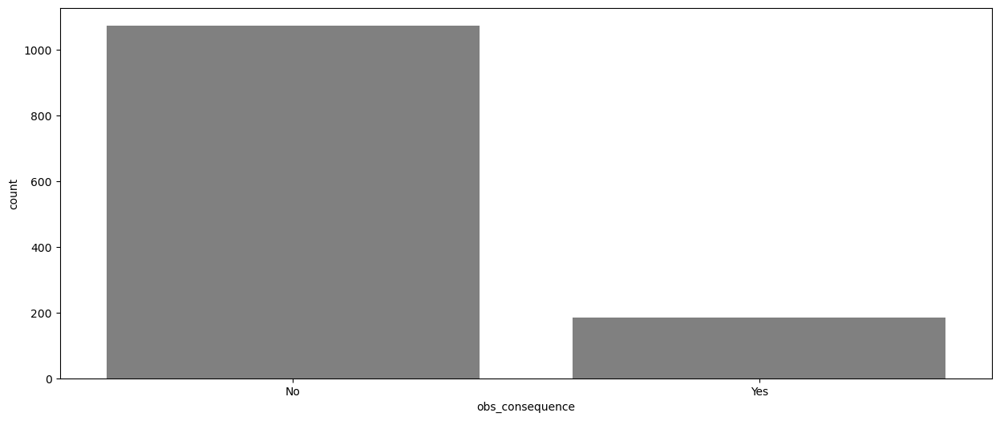

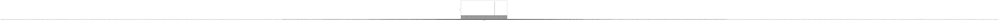

In [24]:
# Categorical feature

#Univariate Analysis
categorical_feature = [feature for feature in df if df[feature].dtypes == 'O']

for feature in categorical_feature:
    plt.figure(figsize=(15,6))
    sns.countplot(data=df,x=df[feature],color='grey')
    plt.show()

#### 👉 Gender feature have so many unique values in it need to clean it with only values [Male, Female, others].
#### 👉 Mutliple countries data is present in the dataset with maximum from united States so we can make it aas 2 category [Us, Non US]

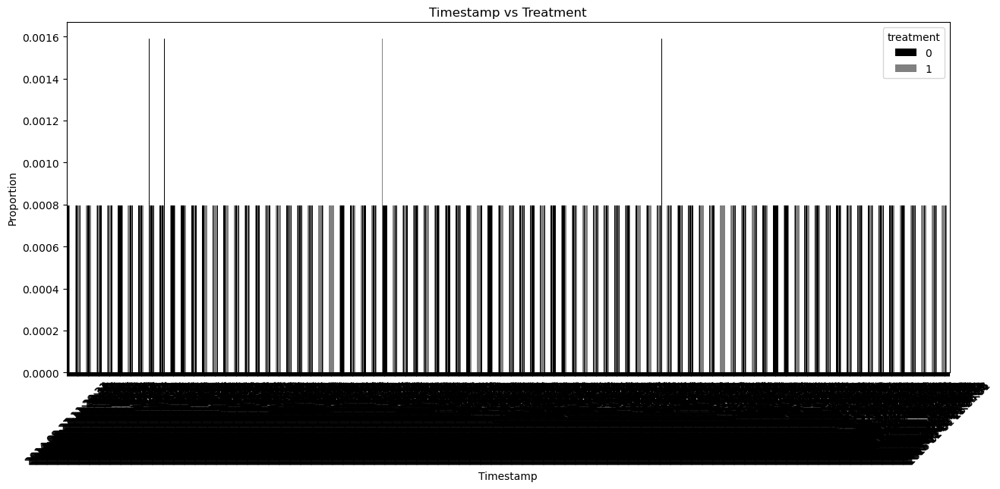

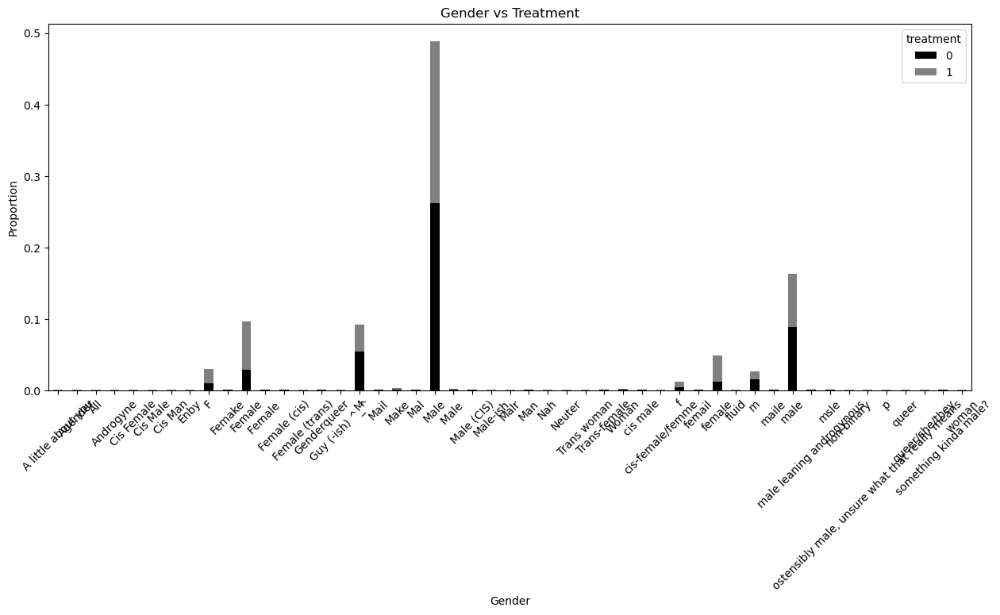

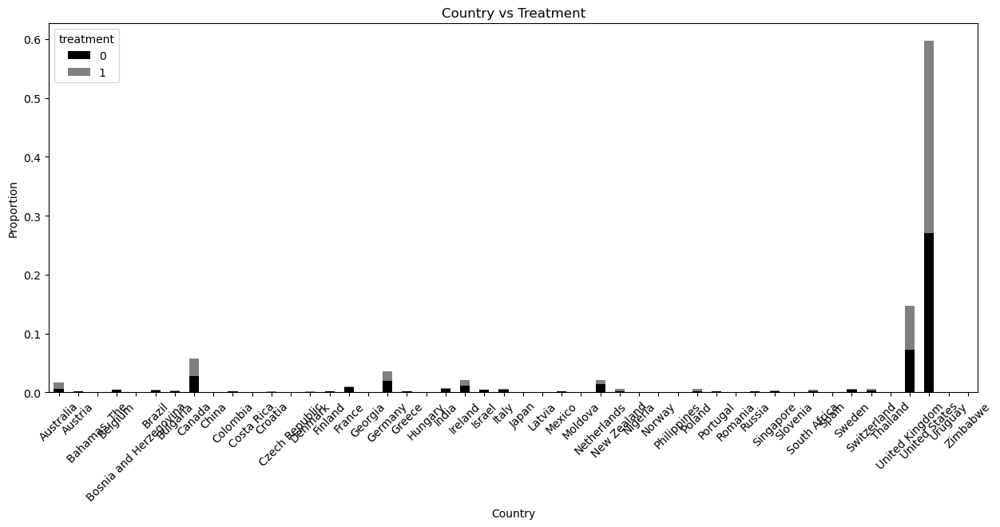

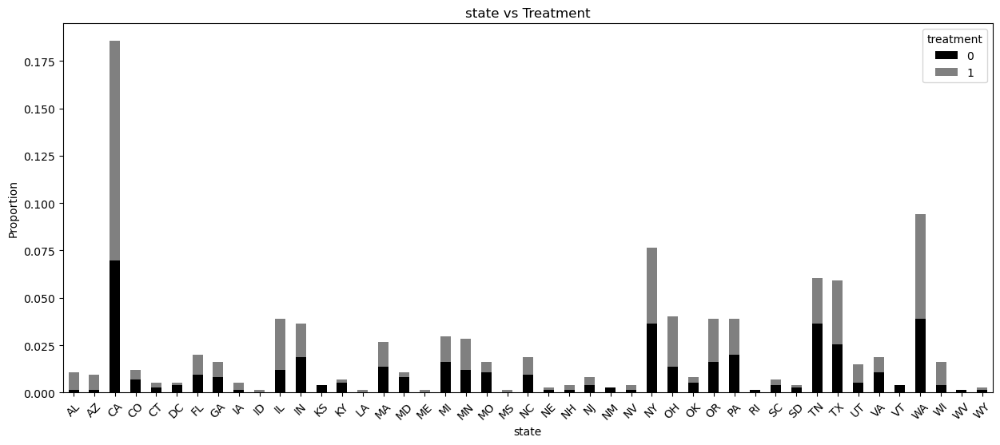

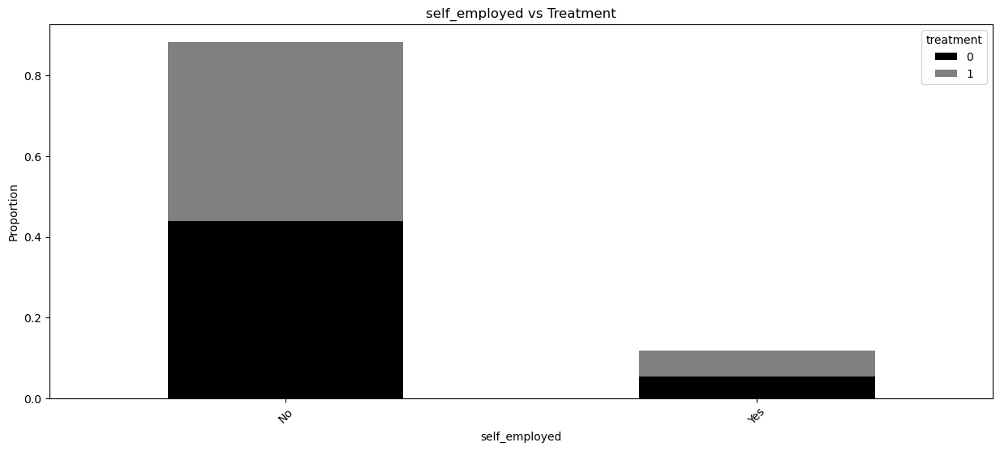

...

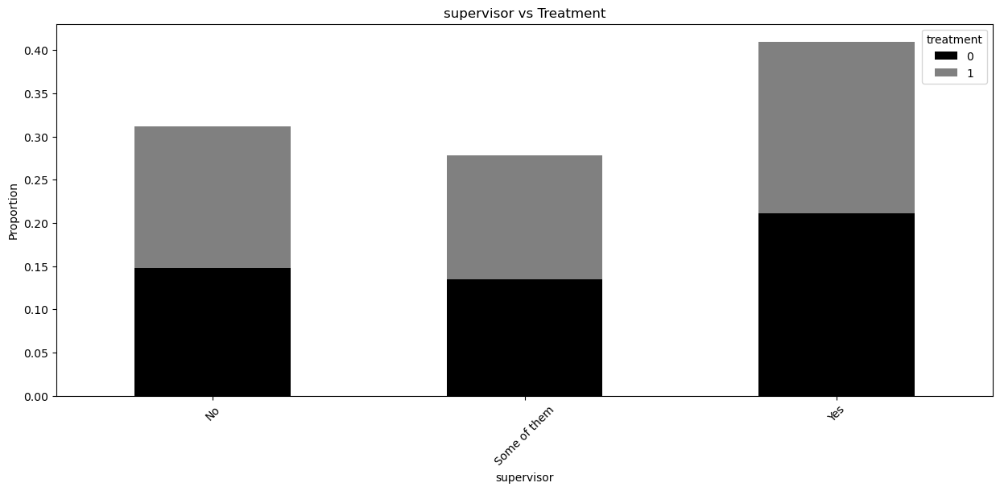

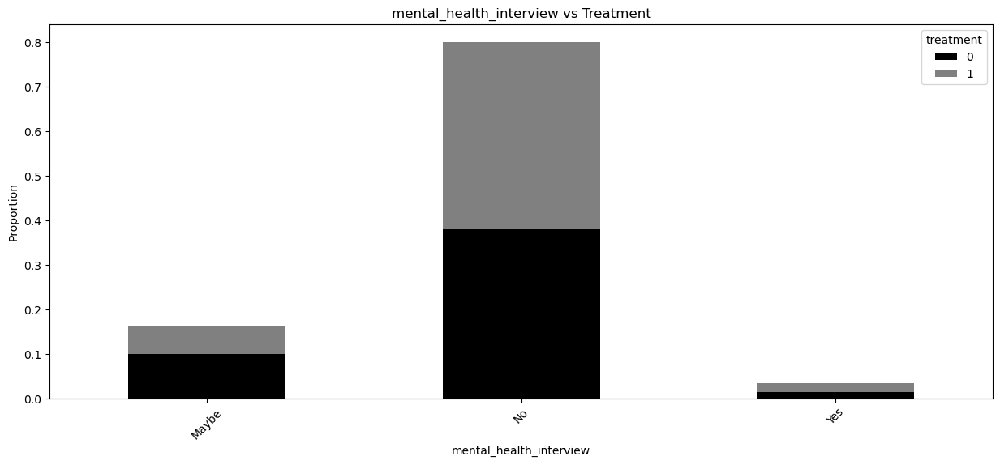

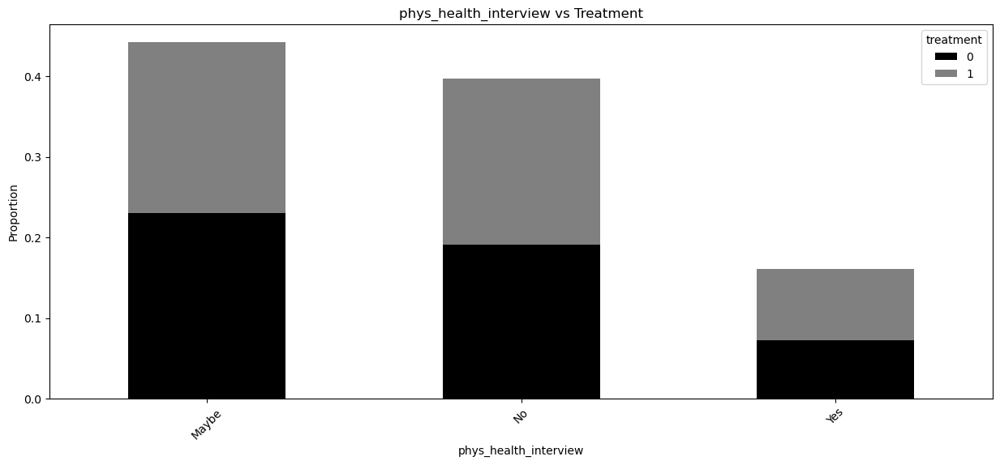

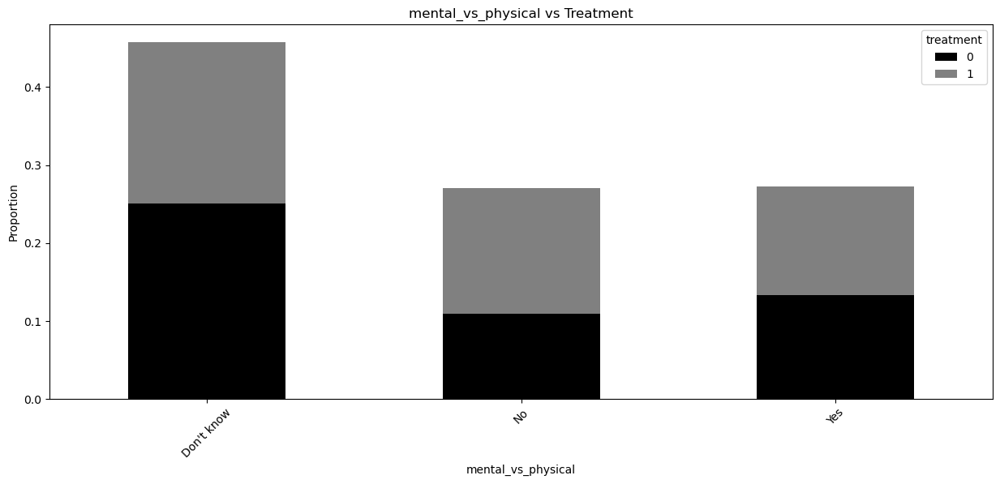

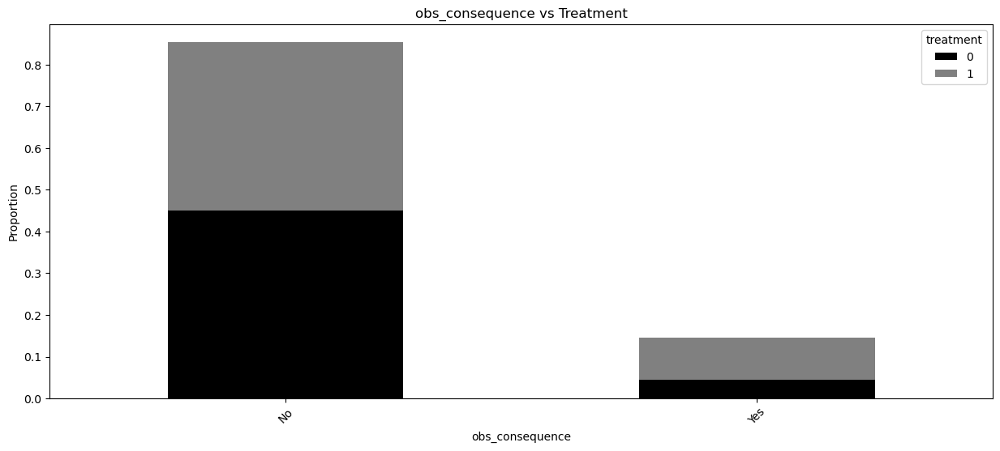

In [26]:
# Bivariate Analysis
for feature in categorical_feature:
    cat_data=df.copy()
    data = pd.crosstab(cat_data[feature],cat_data['treatment'],normalize=True)
    data.plot(kind='bar',stacked=True,figsize=(15,6),color=['black','grey'])
    plt.title(f'{feature} vs Treatment')
    plt.ylabel('Proportion')
    plt.xlabel(feature)
    plt.xticks(rotation=45)
    # plt.tight_layout()
    plt.show()

In [27]:
#Cardinality of Categorical Feature
for feature in categorical_feature:
    print(f"The cardinality of {feature} is :-- {len(df[feature].unique())}\n")

The cardinality of Timestamp is :-- 1246

The cardinality of Gender is :-- 49

The cardinality of Country is :-- 48

The cardinality of state is :-- 46

The cardinality of self_employed is :-- 3

The cardinality of family_history is :-- 2

The cardinality of work_interfere is :-- 5

The cardinality of no_employees is :-- 6

The cardinality of remote_work is :-- 2

The cardinality of tech_company is :-- 2

The cardinality of benefits is :-- 3

The cardinality of care_options is :-- 3

The cardinality of wellness_program is :-- 3

The cardinality of seek_help is :-- 3

The cardinality of anonymity is :-- 3

The cardinality of leave is :-- 5

The cardinality of mental_health_consequence is :-- 3

The cardinality of phys_health_consequence is :-- 3

The cardinality of coworkers is :-- 3

The cardinality of supervisor is :-- 3

The cardinality of mental_health_interview is :-- 3

The cardinality of phys_health_interview is :-- 3

The cardinality of mental_vs_physical is :-- 3

The cardinali

**High cardinality in:**
1. Timestamp
2. State
3. country
4. gender
5. comment

In [59]:
#dropping the columns which are not required.
df.drop(['Timestamp','comments'],axis=1,inplace=True)

In [63]:
df

,Age,Gender,Country,state,self_employed,family_history,treatment,work_interfere,no_employees,remote_work,...,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
0,37,Female,United States,IL,NaN,No,1,Often,6-25,No,...,Yes,Somewhat easy,No,No,Some of them,Yes,No,Maybe,Yes,No
1,44,M,United States,IN,NaN,No,0,Rarely,More than 1000,No,...,Don't know,Don't know,Maybe,No,No,No,No,No,Don't know,No
2,32,Male,Canada,NaN,NaN,No,0,Rarely,6-25,No,...,Don't know,Somewhat difficult,No,No,Yes,Yes,Yes,Yes,No,No
3,31,Male,United Kingdom,NaN,NaN,Yes,1,Often,26-100,No,...,No,Somewhat difficult,Yes,Yes,Some of them,No,Maybe,Maybe,No,Yes
4,31,Male,United States,TX,NaN,No,0,Never,100-500,Yes,...,Don't know,Don't know,No,No,Some of them,Yes,Yes,Yes,Don't know,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,26,male,United Kingdom,NaN,No,No,1,NaN,26-100,No,...,Don't know,Somewhat easy,No,No,Some of them,Some of them,No,No,Don't know,No
1255,32,Male,United States,IL,No,Yes,1,Often,26-100,Yes,...,Yes,Somewhat difficult,No,No,Some of them,Yes,No,No,Yes,No
1256,34,male,United States,CA,No,Yes,1,Sometimes,More than 1000,No,...,Don't know,Somewhat difficult,Yes,Yes,No,No,No,No,No,No
1257,46,f,United States,NC,No,No,0,NaN,100-500,Yes,...,Don't know,Don't know,Yes,No,No,No,No,No,No,No


# Feature Engineering

In [31]:
# Step 1 handling Missing values

In [32]:
# Step 2: Handling false data and outlier

### Keys to handle
- We need to remove outlier from Age column. Use Zscore,IQR, percentile capping
- handle gender column values.
- drop comment & timestamp which is of no use